This Lab is an exploration into how effective different search/pathfinding algorithms are based on assembled node trees.

If you want to just get the data all at once, you can just hit run all cells and wait for the dataset.csv to fill up.

The way data collection works here is that I generate maps based on their length, and I iterate from a start length to an end length
while running all of the pathfinding algorithms separately to get how effective each of them is on the specific maze type.

If you want to change the bounds, change Length1 and Length 2 in the following code. If you want to change how much data is collected at each
integer length for each map, change Trials per Map Length. The dataset.csv is already full of 15000 rows of data that I ran on my conputer.

After hitting run all cells, or running the ones related to the csv (near the end of this notebook file), you can use the defined function 
plotGraph(MapType, Category1, Category2) to show the data collected in comparison to each other. Plug in the categories and mapTypes as strings.

MapTypes:
- BaseMap
- ParabolicMap
- LimitMap
- VaryingMap
- IdealMap

Categories:
- ExecuteTime
- ExploredCells
- TotalPath
- ShortestPath
- Length

I also say "depth" and "position" a lot in this code. It's better to just think of depth as the x position of any coordinate/location, and the same thing for y with position. It just made it easier for me to think of how to make the node trees while using depth and position.

In [1]:
# I would recommend making these smaller. It takes a while to generate a dataset with the numbers this high
Length1 = 10
Length2 = 30
TrialsperMapLength = 50
# Example
#plotGraph("IdealMap", "Length", "ExecuteTime")

In [2]:
# This is neccessary later
import random

# Creating a location class to represent a "location" or cross section in a maze
class Location:
    # We can initialize the Location with a list of other locations it's connected to.
    # The endPoint is a boolean determing whether the location is the end of the maze
    def __init__(self, depth, position, Connections = [], endPoint = False):
        self.depth = depth
        self.position = position
        self.Connections = Connections
        self.endPoint = endPoint
    
    # Returns the depth and position in the column of the Location
    def getPos(self):
        return [self.depth, self.position]
    # Changes the connections listed on the Loc to the ones passed into the function
    def setConnections(self, newConnections):
        self.Connections = newConnections
    # This changes whether or not the Loc is an "exit," like in a maze
    def setEndPoint(self, boolean):
        self.endPoint = boolean

L1 = Location(2, 1)
L1.Connections = [0, 1, 0]
print(L1.Connections)

[0, 1, 0]


Base/Initial stuff

In [3]:
# Initial maze generation

# List of lists with Locations in each column
# The Map is iterated through afterwards to make connections.
# This is VERY initial, so each location is connected to all others on the same level 
# and a random amount of locations on the adjacent levels


# Assigning connections randomly for each of the nodes.
# Each node is connected to a random number of nodes from the previous row
# and all of the nodes in the same row.
def getAdjacentConnections(Map, depth, count1, count2):
    """
    Generates count1 coordinates for the column before depth and count2 coordinates
    for the column after depth in Map.
    """
    # count1 is for the column before the depth given
    # count2 is for the column after the depth given
    Connections = []
    # Randomly generates connections in the previous and next column
    # in the map based on count1 and count2
    for i in range(count1):
        # Checks if it's less than the first row of Map to avoid possible
        # index out of bounds check
        if depth - 1 < 0:
             break
        newCoord = [depth - 1, random.randint(0, len(Map[depth - 1]) - 1)]
        Connections.append(newCoord)
    for i in range(count2):
        # Checks if it's greater than the last row of Map to avoid possible
        # index out of bounds check
        if depth + 2 > len(Map):
            break
        newCoord = [depth + 1, random.randint(0, len(Map[depth + 1]) - 1)]
        Connections.append(newCoord)
    return Connections

def getAllColumnCoords(Map, depth):
    """
    Returns all of the coordinates of the locations in a column
    within Map
    """
    Coords = []
    for i in range(len(Map[depth])):
        Coords.append([depth, i])
    return Coords


def makeMapBase(length, width, pathDensity):
    """
    Returns a rectangular map of Locations length by width.
    Each Location is connected to all others in its same column
    and randomly connected to (pathDensity) many Locations in the column
    before and after it
    """
    Map = []
    # Loops through length and width in Map to generate Locaitons in each index
    for i in range(length):
        # Holder for Locations, appended to Map each loop
        Column = []
        for j in range(width):
            # Location added to Column (width) times
            Loc = Location(i, j)
            Column.append(Loc)
        Map.append(Column)
    # For loop goes through each location in the Map and assigns connections to them
    # Uses both of the functions above
    for i in range(length):
        for j in range(width):
            AdjacentConnections = getAdjacentConnections(Map, i, 0, 3)
            ColumnCoords = getAllColumnCoords(Map, i)
            Connections = AdjacentConnections + ColumnCoords
            # Uses the Location class method setConnections() for each of the Locations in Map
            Map[i][j].setConnections(Connections)
    # This part loops through the map again to make sure connections go both ways. This is
    # neccessary because search methods more than likely would go backwards in a node tree.
    for i in range(length):
        for j in range(width):
            # Connections in each Location being looped through
            Connections = list(Map[i][j].Connections)
            for Coord in Connections:
                # It checks here whether each of the Locations it's connected to is connected to it
                OtherConnections = Map[Coord[0]][Coord[1]].Connections
                # Adds the connection if they aren't connected both ways
                if [i, j] not in OtherConnections:
                    Map[Coord[0]][Coord[1]].setConnections(OtherConnections + [[i, j]])
    return Map

# This was just some test code. It's still usable, but it'll flood your console.
"""
BaseMap = makeMapBase(10, 7, 3)
# Printing out all of the connections to check that it worked
for i in range(len(BaseMap)):
    for j in range(len(BaseMap[i])):
        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(BaseMap[i][j].Connections))
    print(" ")"""


'\nBaseMap = makeMapBase(10, 7, 3)\n# Printing out all of the connections to check that it worked\nfor i in range(len(BaseMap)):\n    for j in range(len(BaseMap[i])):\n        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(BaseMap[i][j].Connections))\n    print(" ")'

This generates a maze, but it's not exactly "accurate" for a variety of reasons:
1) The amount of locations for each column is always the same, which wouldn't exactly be accurate, considering the "frontier" of exploration expands as you go outward.
2) Each of the nodes has far more than 4 paths to and from it, when in reality it would be a max of 4 for each location, cosidering that mazes and the walls within are usually square.
3) Each of the nodes is also able to connect with all of the nodes in the adjacent rows and same rows, which would be wrong considering that it should only connect to those within geographic "proximity" of it.

Some fun things we could try are that we could change the path cost from node to node, which would be fun. We could also just try to generate a node tree from an actual maze, which would obviously be the most accurate.

Parabolic Scaling of amount of locations per column

In [4]:
# Changing the amount of locations per column with parabolic scaling

# This is the function to return an amount of locations to put in each column when
# making the Map. We want it to return the startPaths passed in when the depth given is 0
# and then more and more as the depth gets higher and frontier expands.
def getParabolicColumn(mapLength, depth, startPaths, scalingFactor):
    # This is how "long" the node tree is. We're gonna use this to determine the scaling of the maze 
    # along with the scalingFactor. In later bits of code, the scalingFactor is pretty much always 2
    # because it gets out of hand too quickly to reliably read into a dataset quickly otherwise.
    Columns = mapLength
    # This is to make it so that the values don't get too outrageously large in the middle
    Shrinker = Columns / 6
    # I'm modeling an exponential function, so the transformX is how much I'm shifting it over on 
    # a graph to get the function I want.
    transformX = Columns / 2
    # Based on transformX, this is how far up I shift the y axis of the function in order to make 
    # f(0) = 0.
    transformY = (transformX)**(scalingFactor)
    # 
    return startPaths + int((transformY - abs((depth - transformX)**(scalingFactor)))/Shrinker)

# Testing function
"""
size = 20
sizes = []
for i in range(size):
    sizes.append(getParabolicColumn(size, i, 3, 3))
print(sizes)

"""
# Now we can just implement it off of the base code we already have from the first one
def makeMapParabolic(length, startPaths, scalingFactor, pathDensity):
    """
    Returns a map of locations that is length long. Its locations per column
    go up exponentially with the scalingFactor. pathDensity is how many connections
    each connection makes with the adjacent columns.
    """
    Map = []
    for i in range(length):
        # Changing column width with Parabolic function
        width = getParabolicColumn(length, i, startPaths, scalingFactor)
        Column = []
        for j in range(width):
            Loc = Location(i, j)
            Column.append(Loc)
        #print(len(Row))
        Map.append(Column)
    # All of this is the same as the last map maker
    for i in range(length):
        for j in range(len(Map[i])):
            #print(len(Map[i]))
            AdjacentConnections = getAdjacentConnections(Map, i, 0, pathDensity)
            ColumnCoords = getAllColumnCoords(Map, i)
            Connections = AdjacentConnections + ColumnCoords
            Map[i][j].setConnections(Connections)
    for i in range(length):
        for j in range(len(Map[i])):
            Connections = list(Map[i][j].Connections)
            for Coord in Connections:
                OtherConnections = Map[Coord[0]][Coord[1]].Connections
                if [i, j] not in OtherConnections:
                    Map[Coord[0]][Coord[1]].setConnections(OtherConnections + [[i, j]])
    # returns the generated map
    return Map
"""
ParabolicMap = makeMapParabolic(10, 3, 2, 3)
# Checking that it has a parabolic column count
for i in range(len(ParabolicMap)):
    for j in range(len(ParabolicMap[i])):
        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(ParabolicMap[i][j].Connections))
    print(" ")"""


'\nParabolicMap = makeMapParabolic(10, 3, 2, 3)\n# Checking that it has a parabolic column count\nfor i in range(len(ParabolicMap)):\n    for j in range(len(ParabolicMap[i])):\n        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(ParabolicMap[i][j].Connections))\n    print(" ")'

Limited Connections by count and geography

In [5]:
# Limiting the paths to a set amount per location/node
# Also doing 3) and limiting it by "proximity" because the limited nodes are a part of that.
# We just need to modify the adjacent connections code and not connect it to everything in the same column

# This is to just spit out a random number based on an integer submitted from 1 to 100
# It become useful later
def limitBound(randomNum):
    # The individual probability bounds for the values
    oneBound = 0
    twoBound = 30
    threeBound = 75
    fourBound = 90
    # The actual values are in the return statements.
    if oneBound <= randomNum < twoBound:
        return 1
    elif twoBound <= randomNum < threeBound:
        return 3
    elif threeBound <= randomNum < fourBound:
        return 5
    elif fourBound <= randomNum:
        return 6

# Here's a big one
def getLimitedConnections(Map, LimitMap, depth, position):
    """
    Takes in the position and the relevant Maps (explained later)
    Returns random connections with a radius of the submitted locatiion. The radius is hardcoded
    as proxBound (proximity Bounds) in the function. Needs the Map and new LimitMap to function correctly
    depth and position are the XY values of the location in the list of lists.
    """
    # Holder list for connections to be made
    newConnections = []
    # Premature assignment of Locations that are used later. SelectedLoc is changed to be
    # corresponding to the randomly generated coordinates.
    currentLoc = Map[depth][position]
    selectedLoc = Map[depth][position]
    proxBound = 1

    # These are the bounds for the random coordinate.
    # I have max and min here in order to remove any possibiliy of an index-out-of-bounds error
    # There is a radius proxbound arond where the random num can fall.
    minX = max(0, depth - proxBound)
    maxX = min(len(Map) - 1, depth + proxBound)

    minY = max(0, position - proxBound)
    maxY = min(len(Map[depth]) - 1, position + proxBound)
    # This checks the LimitMap to see whether or not the connections for this location are full
    numPaths = LimitMap[depth][position] - len(Map[depth][position].Connections)
    # Iterates through the remaining available connections
    for i in range(numPaths):
        count = 0
        while True:
            # stops the loop and immediately returns newConnections if no new coordinate is available.
            # see later the end of the loop where it checks the surround locations for available 
            # connection spots
            count += 1
            if count >= 30:
                #newConnections.remove(randCoord)
                return newConnections
            # random x value to place the new connection
            randomDepth = random.randint(minX, maxX)
            
            selectedWidth = len(Map[randomDepth]) - 1
            currentWidth = len(Map[depth]) - 1
            # selectedWidth and currentWidth are used to transform the random y coordinate because
            # the map may or may not have the same number of Locations in each column, so doing this 
            # will allow the Locations to still connect to those locations in the smaller column that 
            # are similar in relative position.
            randomPosition = minY + random.random() * abs(minY - maxY)
            randomPosition = randomPosition * selectedWidth / currentWidth
            randomPosition = round(randomPosition)
            randCoord = [randomDepth, randomPosition]
            
            selectedLoc = Map[randomDepth][randomPosition]  # Instantiate selectedLoc
            # These three booleans check whether the new coord looks at this location, whether
            # the connection is already in this location, and whether the location it woulc connect to
            # has this connection or is full. This is needed because we want to make sure the 
            # amount of connections is limited
            checkCurrentPos = randCoord == currentLoc.getPos()
            checkCurrentConnections = randCoord in currentLoc.Connections or randCoord in newConnections
            checkSelectedConnections = (
                randCoord in selectedLoc.Connections
                and len(selectedLoc.Connections) >= LimitMap[randomDepth][randomPosition]
            )
            if checkCurrentPos == False and checkCurrentConnections == False and checkSelectedConnections == False:
                # If it passes these conditions, it adds the new connections to the connections
                # being returned and to the connections on the corresponding Location.
                newConnections.append(randCoord)
                newSelectedConnections = list(selectedLoc.Connections) + [[depth, position]]
                selectedLoc.Connections = newSelectedConnections
                break
    # returns the list of new connections. It's always passed into a Location where this function is called
    return newConnections
    
    
    
# Now we just need to use the same code we used for the base map but without the adjacent connections and the same-row connections
# We also don't need pathdensity anymore because the map is by default limited to 4
def makeMapLimited(length, width):
    """
    Returns a rectangular map length by width
    Each location is bounded to have a imited number of connections to other
    nearby locations.
    """
    # This is a little different from before. The limitmap determines how many connections each
    # location inside the Map can form.
    Map = []
    LimitMap = []
    for i in range(length):
        # Initializes both columns at once
        Column = []
        LimitColumn = []
        for j in range(width):
            Loc = Location(i, j)
            Column.append(Loc)
            # makes a random int from 1 to 100 and passes it into limitBound function, which returns
            # a number from 1 to 6. I use limitBounds because it makes more sense to me that the
            # distribution of connections in a map would tend towards a certain number, so having
            # an equal probability for all possible numbers wouldn't make sense.
            limitPlacer = limitBound(random.randint(0, 100))
            LimitColumn.append(limitPlacer)
        Map.append(Column)
        LimitMap.append(LimitColumn)
    
    for i in range(length):
        for j in range(width):
            # Calls getLimitedConnections to get random connections within a radius of 1.
            # getLimitedConnections makes sure to account for LimitMap.
            newConnections = getLimitedConnections(Map, LimitMap, i, j)
            existingConnections = Map[i][j].Connections
            Map[i][j].setConnections(existingConnections + newConnections)
            
    return Map
"""
LimitedMap = makeMapLimited(20, 10)

# Checking to make sure the connections are correct:
for i in range(len(LimitedMap)):
    for j in range(len(LimitedMap[i])):
        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(LimitedMap[i][j].Connections))
    print(" ")"""

'\nLimitedMap = makeMapLimited(20, 10)\n\n# Checking to make sure the connections are correct:\nfor i in range(len(LimitedMap)):\n    for j in range(len(LimitedMap[i])):\n        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(LimitedMap[i][j].Connections))\n    print(" ")'

Adding varying path cost between cells (a bit divergent from modeling an actual maze)

In [6]:
# Addding Varying Path cost, we can just return the connections
# with an extra random number on the end of each one. This number would represent
# the amount of "work" to get to that location from the current location.

# Function to take a list of connections and add a path cost
def addPathCost(Connections, maxPathCost, Map):
    # Loops through connections submitted
    for i in Connections:
        # This part checks whether the connection already has more than three numbers on it
        # to filter out mistakes like making some coords 4 indices long
        if len(i) >= 3:
            # if it fails the check, the coord is shortened to three indices and the loop is sent
            # to the next connection because this already has a third nunber (a path cost), so we don't
            # need to add anything
            i = i[:2]
            continue
        # This checks whether or not the connection is already in the location its connecting to.
        if i in Map[i[0]][i[1]].Connections:
            # if it is, then it adds the path cost to both connections
            pathCost = random.randint(1, maxPathCost)
            otherIndex = Map[i[0]][i[1]].Connections.index(i)
            Map[i[0]][i[1]].Connections[otherIndex].append(pathCost)
            i.append(pathCost)
        else: 
            # if it's not, it creates the connection and adds the path cost to both
            pathCost = random.randint(1, maxPathCost)
            i.append(pathCost)
            newConnections = list(Map[i[0]][i[1]].Connections) + [i]
            Map[i[0]][i[1]].setConnections(newConnections)
        # You would think that the >= 3 would be bad because the = stops valid coords from checking 
        # their connections, but it's actually supposed to be there because valid coords would have
        # already had a two way connection added with a path cost by this code, so it doesn't need to 
        # check at all.

# This is a bit of a demo, so it's basically the same code as the base map maker.
def makeMapVarying(length, width, pathDensity, maxPathCost):
    """
    This is essentially the same as the makeMapBase function except we call
    addPathCost to add a randomized path cost.
    """
    Map = []
    for i in range(length):
        Column = []
        for j in range(width):
            Loc = Location(i, j)
            Column.append(Loc)
        Map.append(Column)
    for i in range(length):
        for j in range(width):
            AdjacentConnections = getAdjacentConnections(Map, i, pathDensity, 0)
            ColumnCoords = getAllColumnCoords(Map, i)
            Connections = AdjacentConnections + ColumnCoords
            Map[i][j].setConnections(Connections)
    for i in range(length):
        for j in range(width):
            Connections = list(Map[i][j].Connections)
            for Coord in Connections:
                OtherConnections = Map[Coord[0]][Coord[1]].Connections
                if [i, j] not in OtherConnections:
                    Map[Coord[0]][Coord[1]].setConnections(OtherConnections + [[i, j]])
    # This is added after because the getLimitedConnections function adds connections
    # to already existing locations, so the addPathCost would miss them when iterating through
    for Column in Map:
        for Loc in Column:
            addPathCost(Loc.Connections, maxPathCost, Map)
    return Map
"""
VaryingMap = makeMapVarying(10, 5, 3, 3)

# Checking to see if there is an extra number on each connection corresponding to path cost
for i in range(len(VaryingMap)):
    for j in range(len(VaryingMap[i])):
        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(VaryingMap[i][j].Connections))
    print(" ")"""


'\nVaryingMap = makeMapVarying(10, 5, 3, 3)\n\n# Checking to see if there is an extra number on each connection corresponding to path cost\nfor i in range(len(VaryingMap)):\n    for j in range(len(VaryingMap[i])):\n        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(VaryingMap[i][j].Connections))\n    print(" ")'

Combining everything to make an "ideal" map generator

In [7]:
# Here we basically just combine everything in all the previous map makers

# If we want there to be uniform path cost all around, we can just set the maxPathCost = 1

def makeMapIdeal(length, startPaths, scalingFactor, maxPathCost):
    """
    Returns a map length long with the number of locations per column going up exponentially with the   
    scaling factor and the length. Randomly assigns path cost between locations, bounded between 0 and
    the maxPathCost. It's a combination of all the other mapMakers
    """
    # Same limitMap as the limited map maker.
    Map = []
    limitMap = []
    for i in range(length):
        # parabolic scaling
        width = getParabolicColumn(length, i, startPaths, scalingFactor)
        Column = []
        limitColumn = []
        for j in range(width):
            Loc = Location(i, j)
            Column.append(Loc)
            limitPlacer = limitBound(random.randint(0, 100))
            limitColumn.append(limitPlacer)
        #print(len(Row))
        Map.append(Column)
        limitMap.append(limitColumn)
    
    for i in range(length):
        for j in range(len(Map[i])):
            # Same as limited map maker.
            Connections = getLimitedConnections(Map, limitMap, i, j)
            Map[i][j].setConnections(Connections)
    # This is added after because the getLimitedConnections function adds connections
    # to already existing locations, so the addPathCost would miss them when iterating through
    for i in range(length):
        for j in range(len(Map[i])):
            addPathCost(Map[i][j].Connections, maxPathCost, Map)
    return Map
"""
IdealMap = makeMapIdeal(15, 3, 2, 5)

# Checking to make sure the connections are correct:
for i in range(len(IdealMap)):
    for j in range(len(IdealMap[i])):
        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(IdealMap[i][j].Connections))
    print(" ")"""

'\nIdealMap = makeMapIdeal(15, 3, 2, 5)\n\n# Checking to make sure the connections are correct:\nfor i in range(len(IdealMap)):\n    for j in range(len(IdealMap[i])):\n        print("(" + str(i) + ", " + str(j) + ") Connected: " + str(IdealMap[i][j].Connections))\n    print(" ")'

Visualizing Location trees

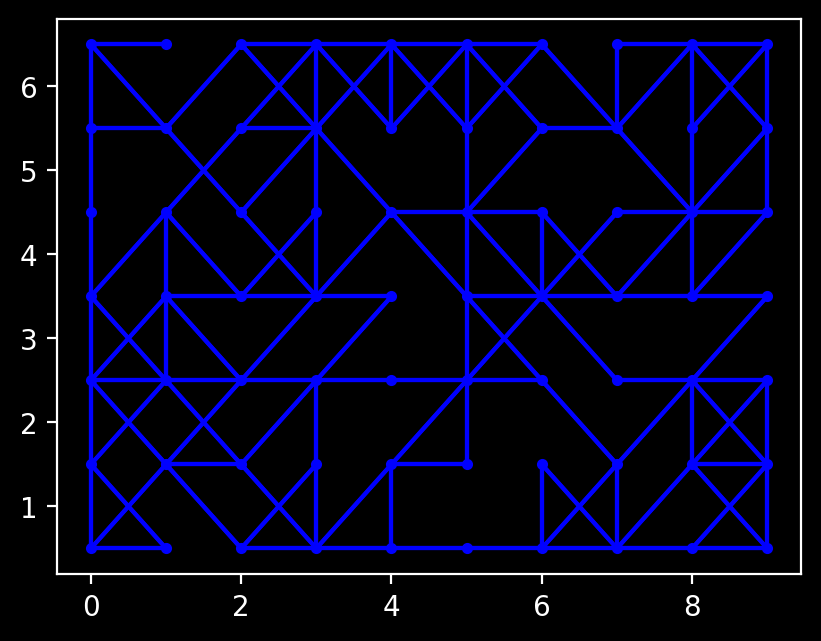

In [8]:
# Code to generate a visual plot of a map
import matplotlib.pyplot as plt

# This just plots a line on a matplotlib graph
def plotLine(start, end, Color, Thickness):
    xCoords = [start[0], end[0]]
    yCoords = [start[1], end[1]]
    plt.plot(xCoords, yCoords, color = Color, linewidth = Thickness)
    
# This takes in a location and iterates through its connections, plotting each as a line.
def plotConnections(Location, Map, maxWidth):
    Connections = list(Location.Connections)
    # Gets the depth of this Location
    depth = Location.getPos()[0]
    for Loc in Connections:
        # These two are the adjusted start and end Y positions. The reason I do this is that I like
        # when the graph appears centered, so I adjust each of the Locations on the graph to be evenly
        # spaced and transformed in position to the be more centered in the graph. It also
        # helps with readability
        newStartY = Location.getPos()[1] * maxWidth / len(Map[depth]) + maxWidth / len(Map[depth]) / 2
        newEndY = Loc[1] * maxWidth / len(Map[Loc[0]]) + maxWidth / len(Map[Loc[0]]) / 2   
        # Check if it has path cost
        if len(Loc) > 2:
            # If it has a path cost, then it divides 1.5 by the path cost to make the "harder" paths
            # more narrow.
            plotLine([depth, newStartY], [Loc[0], newEndY], "blue", 1.5 / Loc[2])
        else:
            # Otherwise it just uses standard 1.5 for line thickness.
            plotLine([depth, newStartY], [Loc[0], newEndY], "blue", 1.5 )

def generatePlot(Map):
    # I need to get the max width of the function because it's used to adjust the
    # y position of the displayed lines and nodes to make the graph look better.
    maxWidth = 0
    for i in Map:
        if len(i) > maxWidth:
            maxWidth = len(i)

    # Loops through the map and calls the plotConnections function for each location
    for i in range(len(Map)):
        # getting the width of the column we're looking at.
        currentWidth = len(Map[i])
        for j in range(currentWidth):
            # Here is where I graph the points where the lines connect. This is the
            # transformation applied to make the points evenly spaced and fixed on the center.
            transformPos = j * maxWidth / currentWidth + maxWidth / currentWidth / 2
            # plotting the points
            plt.plot(i, transformPos, marker = "o", color = "blue", markersize = 3)
            # plotting the Connections through earlier function call.
            plotConnections(Map[i][j], Map, maxWidth)

# Example Graphs
# Don't put 1 in for the initial values
#IdealMap = makeMapIdeal(15, 5, 2, 2)
#IdealPlot = generatePlot(IdealMap)
LimitedMap = makeMapLimited(10, 7)
LimitedPlot = generatePlot(LimitedMap)
#BaseMap = makeMapBase(10, 5, 3)
#BasePlot = generatePlot(BaseMap)
#ParabolicMap = makeMapParabolic(10, 3, 2, 3)
#ParabolicPlot = generatePlot(ParabolicMap)
#varyingMap = makeMapVarying(10, 5, 3, 3)
#varyingPlot = generatePlot(varyingMap)


Now This is where the pathfinding begins. We need to create an Explorer class that can run through the mazes based on a function determining which nodes to expand.

In [9]:
import time

# Explore methods

# Returns the location on the frontier that was last added.
# This causes the exlporer to go very deep very fast, but very shallow
# in terms of finding all the paths
def depthFirst(frontier):
    return frontier[-1]

# Returns the location on the frontier that was first added
# This causes the explorer to explore every path at once, which takes longer
# but finds the best paths
def breadthFirst(frontier):
    return frontier[0]

# Returns the location on the frontier with the lowest path cost
# defaults to depthFirst in the case of no path cost.
def bestFirst(frontier):
    # Holds this in memory as we iterate through the frontier.
    # points at smaller and smaller values and returns the smallest index
    lowestIndex = 0
    # Checks whether it has a path cost. If not, returns the depthFirst method
    if len(frontier[0]) < 3:
        return depthFirst(frontier)
    # If it has a path cost, assigns the first value so we can iterate through.
    else:
        lowestCost = frontier[0][2]
    # Iterates through the path costs on the frontier and returns the smallest.
    for index, Loc in enumerate(frontier):
        if len(Loc) < 3:
            lowestIndex = -1
            break
        elif Loc[2] < lowestCost:
            lowestIndex = index
            lowestCost = Loc[2]
    return frontier[lowestIndex]

# Heuristic functions are often used to improve efficiency of search algorithms
def simpleHeuristic(Loc, Map, endPoint):
    # Returns manhattan distance to endpoint
    # This accounts for relative difference in Column length, as the connections between
    # locations in columns are spaced relatively evenly. 
    xDistance = abs(endPoint[0] - Loc[0])
    currentWidth = len(Map[Loc[0]])
    endWidth = len(Map[endPoint[0]])
    yDistance = abs(endPoint[1] - Loc[1] * endWidth / currentWidth)
    
    return xDistance + yDistance

# Methods that have access to heuristic functions

# greedyBestFirst returns the location on the frontier where the heuristic function is
# the lowest. In the case of manhattan distance, it's the one that's closest to the endpoint.
def greedyBestFirst(frontier, Map, endPoint):
    # This just iterates through the frontier and returns one with the smallest returned value
    # for the heuristic function
    lowestIndex = 0
    lowestCost = simpleHeuristic(frontier[0], Map, endPoint)
    for index, Loc in enumerate(frontier):
        estCosttoEnd = simpleHeuristic(Loc, Map, endPoint)
        if estCosttoEnd < lowestCost:
            lowestCost = estCosttoEnd
            lowestIndex = index
    return frontier[lowestIndex]

# AStar combines the heuristic with the path cost. It returns the node on the frontier thats
# the closest to the endpoint (manhattan distance) while taking into consideration how "hard"
# it would be to get to that point.
def AStar(frontier, Map, endPoint):
    lowestIndex = 0
    # if there's no path cost, it defaults to greedyBestFirst the initial assignment
    if len(frontier[0]) < 3:
        return 1 + simpleHeuristic(frontier, Map, endPoint)
    # if there is a path cost, it iterates through the frontier for the lowest combination
    # of path cost and the heuristic fuction (manhattan distance)
    else:
        # initial "lowest" value to be compared againt when iterating
        lowestCost = frontier[0][2] + simpleHeuristic(frontier[0], Map, endPoint)
    # iterating through the frontier
    for index, Loc in enumerate(frontier):
        # defaults to greedyBestFirst
        if len(Loc) < 3:
            AStarCost = 1 + simpleHeuristic(Loc, Map, endPoint)
        else:
            AStarCost = Loc[2] + simpleHeuristic(Loc, Map, endPoint)
        if AStarCost < lowestCost:
            lowestCost = AStarCost
            lowestIndex = index
    return frontier[lowestIndex]    

# This is the class that does all the heavy lifting for the pathfinding.
class Explorer:
    def __init__(self, exploreMethod):
        # the exploremethods (e.g. bestFirst & AStar) are passed into the class initializer
        self.exploreMethod = exploreMethod
        # frontier keeps track of all the Locations it could travel to
        self.frontier = []
        # directPaths is added to at the end (explained later)
        self.directPaths = []
        # visited keeps track of all the locations that it has already visited
        self.visited = []
        # paths keeps track of all the possible paths taken from the start to the current position.
        self.paths = []

    def explore(self, Map, start, endPoint):
        # Initial values on the frontier when first entering the location tree
        self.frontier = []
        self.frontier = self.frontier + start
        # countBound assigned 0 here. It's meant to limit the amount of times the explorer can
        # reach a new location to stop timeouts in the while loop
        countBound = 0
        # count is the amount of times the while loop has been executed --> the amount of times
        # a new location has been reached
        count = 0
        # this is to stop timeouts when running.
        hardLimit = 10000
        # inital is zero, this is meant to measure the total path cost of traveling across
        # all the locations as it searches through the location tree.
        totalPath = 0
        # self.visited becomes a map with true/false values for whether that location
        # has been visited. Has same dimensions as map
        self.visited = []
        for i in range(len(Map)):
            Column = []
            for j in range(len(Map[i])):
                # This runs the same amount of times as there are locations in the map
                # so a it limits the amount of times the while loop can be run to twice that
                countBound += 2
                Column.append(False)
            self.visited.append(Column)
        # This is to determine later how long the execution of the exploration took
        startTime = time.time()
        # This is to determine whether or not the explorer succeeded in finding the endPoint.
        # Because of the interconnectedness of many of my maps, it's almost impossible to fail.
        Success = False
        # initial assignments for directPaths and paths. This is neccessary because if you call this
        # function multiple times in a for loop with the same explorer, the paths and directPaths for 
        # the maze have to be reset, or the explorer will add to already existing data and fail in some way
        self.directPaths = []
        self.paths = []
        # appends each of the starting locations as a path of length 1 to self.paths
        for i in start:
            self.paths.append([i])
        
        while self.frontier:
            # Checks the type of exploreMethod because they have different required parameters
            if id(self.exploreMethod) == id(greedyBestFirst) or id(self.exploreMethod) == id(AStar):
                Loc = self.exploreMethod(self.frontier, Map, endPoint)
            else:
                Loc = self.exploreMethod(self.frontier)
            
            # Location selected from the frontier
            # --> go to that location
            # --> location is visited (true)
            # --> remove from frontier (locations to be visited)
            self.visited[Loc[0]][Loc[1]] = True
            self.frontier.remove(Loc)

            # Checks if the location has a pathcost. If not it just adds 1 instead.
            if len(Loc) < 3:
                totalPath += 1
            else:
                totalPath += Loc[2]

            # Checks if the location is the endpoint. This is done better later, but I left this
            # here just in case so it doesn't miss anything
            if Map[Loc[0]][Loc[1]].endPoint == True or [Loc[0], Loc[1]] == endPoint:
                # we subtract end and start time later to get the execution time
                endTime = time.time()
                Success = True
                #print("Success!")
                # stops the loop when endpoint is found
                break

            count += 1
            if count > countBound or count > hardLimit:
                #print("Forcequit")
                # stops the loop in case of timeout
                break

            # The connections on the Location we just took from the frontier.
            newConnections = list(Map[Loc[0]][Loc[1]].Connections)
            
            # We need this copy because we actively remove stuff from the original while
            # looping through the copy.
            copiedConnnections = list(newConnections)

            # loops through the copy while removing uneccessary stuff from the original
            for i in copiedConnnections:
                # Checks if the connection is in the first row. We already have the start coords,
                # so we don't need to visit them twice on the frontier
                if i[0] == 0:
                    newConnections.remove(i)
                # len(self.visited) and len(self.visited[i]) are the dimensions of the map, so this
                # removes any connections pointing to an index out of bounds
                elif i[0] < 0 or i[0] > len(self.visited) - 1 or i[1] < 0 or i[1] > len(self.visited[i[0]]) - 1:
                    newConnections.remove(i)
                # This checks if the location the connection is pointing to has been visited before.
                # if it has, then it removes the connection. You would think that it would be better to 
                # leave it in so we can find more ideal paths, as path cost to that location may vary, 
                # but this would drastically increase computation time and would make it much harder to 
                # keep track of where the explorer should go.
                elif self.visited[i[0]][i[1]] == True or i in self.frontier:
                    newConnections.remove(i)

            # Adds the connections to the frontier after cleaning them. This is just adding more
            # visitable locations to the frontier.
            self.frontier = self.frontier + newConnections
            
            # copy of the list of paths. This is needed because we remove stuff while iterating
            # through the path list.
            currentPaths = list(self.paths)
            
            # loops through current paths. The pupose of this is to add the new connections
            # on each location to the paths that they correspond to.
            for path in currentPaths:
                # checks if the path ended in the current Location, in which case we add the connections
                if path[-1] == Loc:
                    # Creating new paths and appending them to self.paths
                    for newLoc in newConnections:
                        newPath = list(path + [newLoc])
                        self.paths.append(newPath)
                        # checks if the location being connected to is the endPoint, same as earlier code
                        if Map[newLoc[0]][newLoc[1]].endPoint == True or [newLoc[0], newLoc[1]] == endPoint:
                            endTime = time.time()
                            Success = True
                            #print("Success!")
                            break
                    # removes the original redundant path This is done to reduce the amount the explorer
                    # has to hold in memory.
                    self.paths.remove(path)
            # Success would have been assigned earlier in the path loop, so this breaks the outer loop
            # so the program can end.
            if Success == True:
                break
            
        # This is where directPaths comes in. This loops through the paths and appends the ones
        # containing the endPoint to directPaths --> direct paths to the endpoint
        for path in self.paths:
            for Length in path:
                if [Length[0], Length[1]] == endPoint:
                    self.directPaths.append(path)
        # holder list for pathlengths (path cost over full path)
        PathLengths = []
        #print(self.paths)
        # loops through each of the directPaths while adding the Pathlengths
        for path in self.directPaths:
            PathLength = 0
            for Length in path:
                # checks if the path has a pathCost.
                if len(Length) < 3:
                    PathLength += 1
                else:
                    # adds path cost for every connection in directPaths
                    PathLength += Length[2]
            PathLengths.append(PathLength)
        #print(count)
        # Checks if the program actually succeeded
        if Success == True:
            # Looks though the PathLengths list to determine the index of the easiest path in directPaths
            BestPathIndex = PathLengths.index(min(PathLengths))
            # the actual easiest path found, connection by connection
            BestPath = self.directPaths[BestPathIndex]
            # the length of the easiest path found
            BestPathLength = PathLengths[BestPathIndex]
        else:
            # assigns this here because it was only ever assigned in the success cases before
            endTime = time.time()
            # assigns 0 to these because they don't matter. I filter out the fail cases (very few) anyway
            BestPathIndex = 0
            BestPathLength = 0
        timeToExecute = endTime - startTime
        # returns a bunch of data. 
        return {"Algorithm" : self.exploreMethod.__name__, "ExecuteTime" : timeToExecute, "ExploredCells": count, "TotalPath": totalPath, "ShortestPath": BestPathLength, "Success" : Success}

Making the Data and Using it

In [10]:
import csv

# initializing all of the explorers with their algorithms
depthExplorer = Explorer(depthFirst)
breadthExplorer = Explorer(breadthFirst)
bestFirstExplorer = Explorer(bestFirst)
greedyBestExplorer = Explorer(greedyBestFirst)
AStarExplorer = Explorer(AStar)
# list of explorers so we can loop through it
explorers = [depthExplorer, breadthExplorer, bestFirstExplorer, greedyBestExplorer, AStarExplorer]

# loops through the list of explorers and runs the explore method for the given map
def getData(Map, cutoff, explorers):
    data = []
    # this is needed so we can pass in the start to the function
    start = []
    for i in Map[0]:
        # I put in path cost here because sometimes maps generate with a huge gap in the middle right
        # after the start
        start.append(i.getPos() + [1])
    # random positioning of the endpoint
    # the cutoff is how far from the start of the maze the end can be generated
    endDepth = random.randint(int(len(Map) * cutoff), len(Map) - 1)
    endPos = random.randint(0, len(Map[endDepth]) - 1)
    endPoint = [endDepth, endPos]
    Map[endDepth][endPos].endPoint = True
    # data needs to be assembled for 5 explorers at once, so we need to return a list
    # of all the data they returned
    for explorer in explorers: 
        newData = explorer.explore(Map, start, endPoint)
        data.append(newData)
    return data
    
# this generates a bunch of new maps based on the length submitted
def generateMaps(Length):
    BaseMap = makeMapBase(Length, int(Length / 2), 3)
    ParabolicMap = makeMapParabolic(Length, int(Length / 2), 2, 3)
    VaryingMap = makeMapVarying(Length, int(Length / 2), 3, 3)
    LimitMap = makeMapLimited(Length, int(Length / 2))
    IdealMap = makeMapIdeal(Length, int(Length / 2), 2, 3)
    # returns the names of the maps with the maps in a map pair so we can read it into a csv and database
    Maps = [[BaseMap, "BaseMap"], [ParabolicMap, "ParabolicMap"], [VaryingMap, "VaryingMap"], [LimitMap, "LimitMap"], [IdealMap, "IdealMap"]]
    return Maps

data = []

# Length1 and Length2 are the length bounds. It loops from 1 to 2 to get data across all the lengths
# they are assigned at the start of the file with TrialsperMapLength
for Len in range(Length1, Length2):
    # Trials per map length is the amount of trials run per integer length per map
    for i in range(TrialsperMapLength):
        # getting new maps based on current length
        Maps = generateMaps(Len)
        for MapPair in Maps:
            # Because it returns 5 rows at once. One for each explorer
            Map = MapPair[0]
            MapName = MapPair[1]
            # cutoff = 1/2
            rows = getData(Map, 1/2, explorers)
            for row in rows:
                # This is so we can organize the data by length when visualizing it
                row["Length"] = Len
                row["MapType"] = MapName
                #print(row)
                # all of it is sent into this dataset
                data.append(row)

# Writing data into a csv:
with open("dataset.csv", "w", newline = "") as file:
    file.truncate(0)
    fieldNames = ['Algorithm', 'ExecuteTime', 'ExploredCells', 'TotalPath', 'ShortestPath', 'Length', 'MapType', 'Success']
    writer = csv.DictWriter(file, fieldnames = fieldNames)
    writer.writeheader()
    for row in data:
        writer.writerow({'Algorithm': row['Algorithm'], 'ExecuteTime': row['ExecuteTime'], 'ExploredCells': row['ExploredCells'], 'TotalPath': row['TotalPath'], 'ShortestPath': row['ShortestPath'], 'Length': row['Length'], 'MapType': row['MapType'], "Success": row['Success']})




Reading and displaying the data

In [11]:
import pandas as pd
import csv
# We already have the data in the data list, but lets read it in from the csv for the sake of realism

csvData = []
# reading all of the data back from the csv. this section is independently executable from the rest of
# the file because it only relies on the csv.
failCount = 0
totalCount = 0
with open("dataset.csv", 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        newRow = row
        if row["Success"] == 'False':
            #print(row)
            failCount += 1
            continue
        newRow["ExecuteTime"] = float(row["ExecuteTime"])
        newRow["ExploredCells"] = int(row["ExploredCells"])
        newRow["TotalPath"] = int(row["TotalPath"])
        newRow["ShortestPath"] = int(row["ShortestPath"])
        newRow["Length"] = int(row["Length"])
        csvData.append(newRow)
        totalCount += 1
        #print(row)
print("Fail %: " + str(100*(failCount / totalCount)))

# Now we can group all of the data by map type. Then we can show specific parts such as
# the length and the shortest path found organized by the explorer type.

# So we want to loop through dataset. Return dictionary keyed to each map type. Those entries
# should in turn return dictionaries organizing two seperate categories against each other
"""
Categories to organize:
Execute Time
Explored Cells
Total Path
Shortest Path
Length
--> 5 choose 2 combinations we can make:
Explored Cells & Execute Time
Explored Cells & Total Path (no)
Explored Cells & Shortest Path
Explored Cells & Length
Execute Time & Total Path (no)
Execute Time & Shortest Path
Execute Time & Length
Total Path & Shortest Path (no)
Total Path & Length (no)
Shortest Path & Length
"""
dataFrame = pd.DataFrame(csvData)
mapNames = dataFrame["MapType"].unique()
#print(mapNames)
# initializing dictionary so we can cal from it later
mapData = {}
# categories of data we want to organize by in the dataframe
Categories = ["ExploredCells", "ExecuteTime", "Length", "ShortestPath", "TotalPath"]
# loops through map names so we can organize by map
for mapName in mapNames:
    # new spot in mapData dict
    mapData[mapName] = {}
    # enumerating through Categories
    for index, category1 in enumerate(Categories):
        # new list of all Categories but category1
        remaining = list(Categories[:index] + Categories[index + 1:]) 
        # loops through the remaining so we can have every combination of every category
        # in every order
        for category2 in remaining:
            # organize data by map type
            mapDataFrame = dataFrame[dataFrame["MapType"] == mapName]
            # group the data by the Algorithm and the two categories
            groupedMapData = mapDataFrame.groupby(["Algorithm", category1])[category2].mean()
            #print(category1 + " & " + category2)
            # we unstack here so we can plot the algorithms on the same graph separately
            mapData[mapName][category1 + " & " + category2] = groupedMapData.unstack(level = "Algorithm")
# ex)
#mapData["BaseMap"]["ExploredCells & ExecuteTime"].plot(kind='line', marker='o', colormap="viridis")

# cool function. It works because of how I set up mapData {}
# plots any combination of map and two data categories given against each other.
def plotGraph(MapType, Category1, Category2):
    newPlot = mapData[MapType][Category1 + " & " + Category2].plot(kind='line', marker='o', colormap="viridis")
    newPlot.legend(title = "Algorithm")
    newPlot.set_xlabel(Category1)
    newPlot.set_ylabel(Category2)
    plt.title(MapType + " " + Category2 + " by " + Category1)



Fail %: 1.7459606853607912


/var/mobile/Containers/Data/Application/34C66F4E-53A2-48B4-98FE-2D73550C89B7/Library/Application Support/com.rationalmatter.junoapp/python-home/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


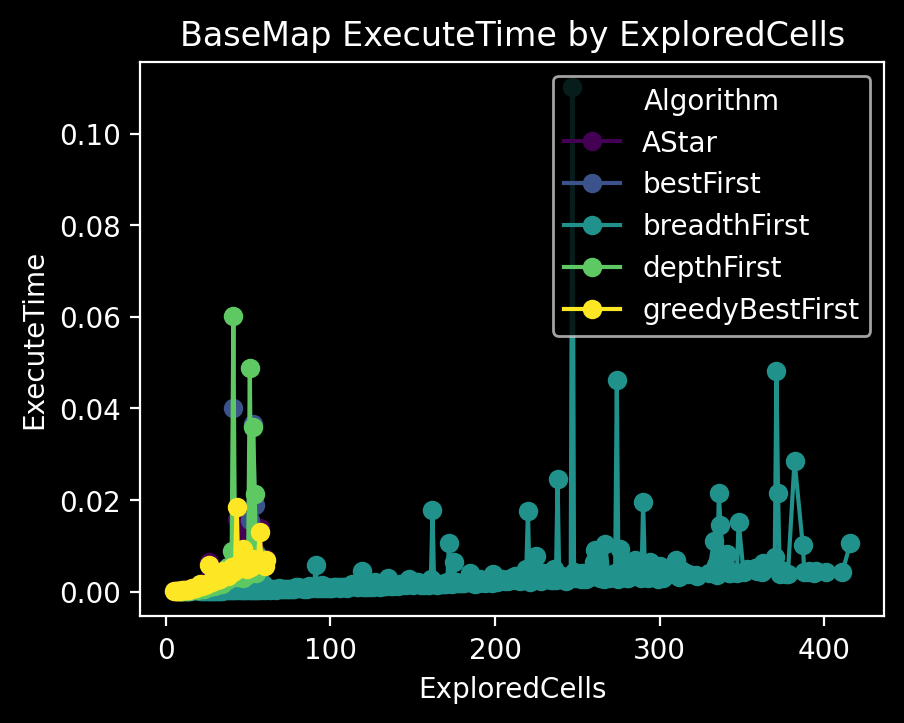

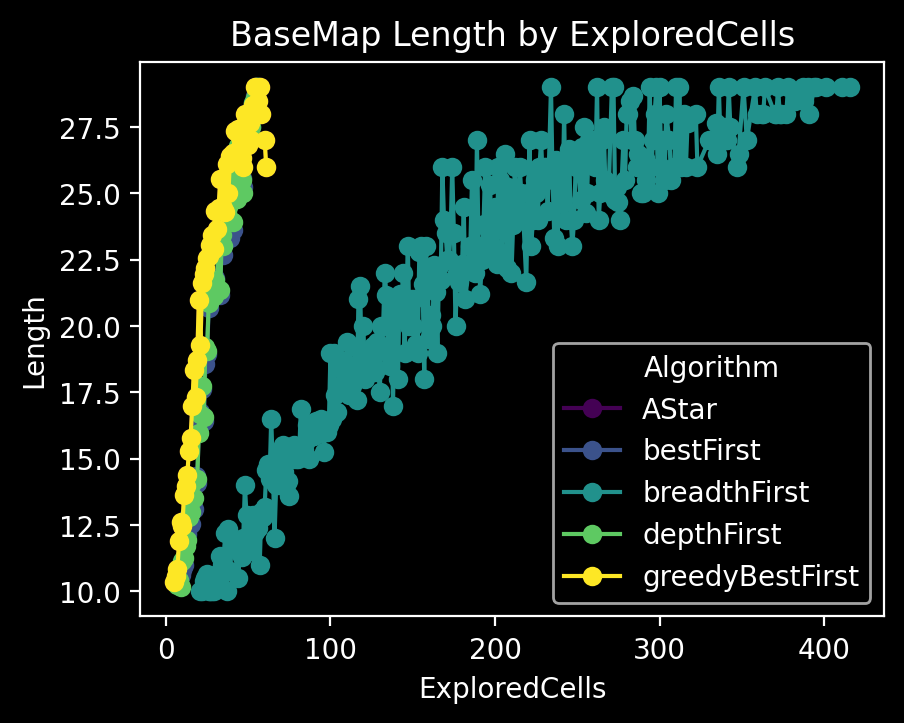

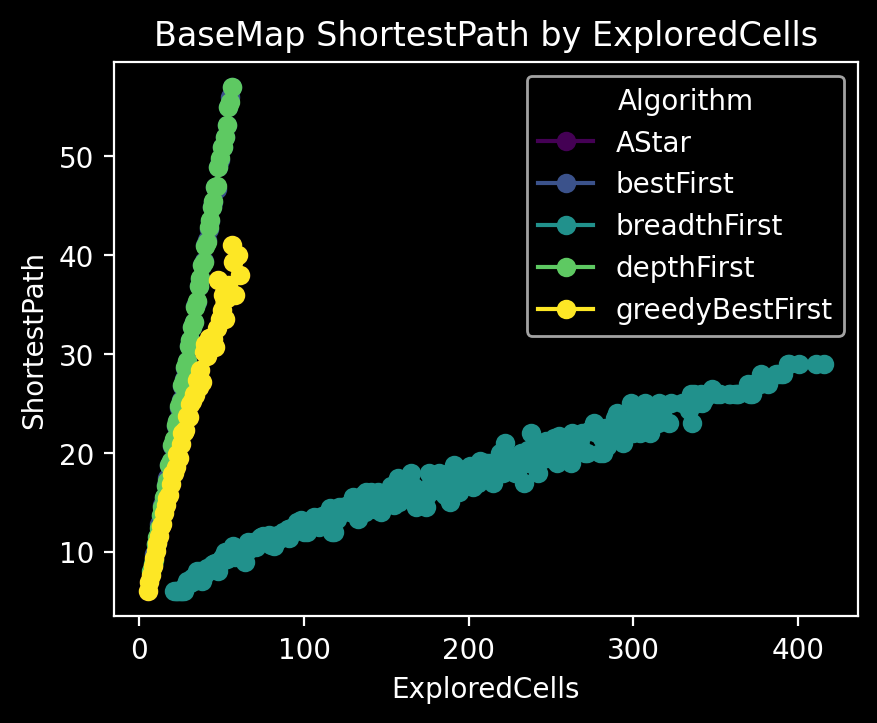

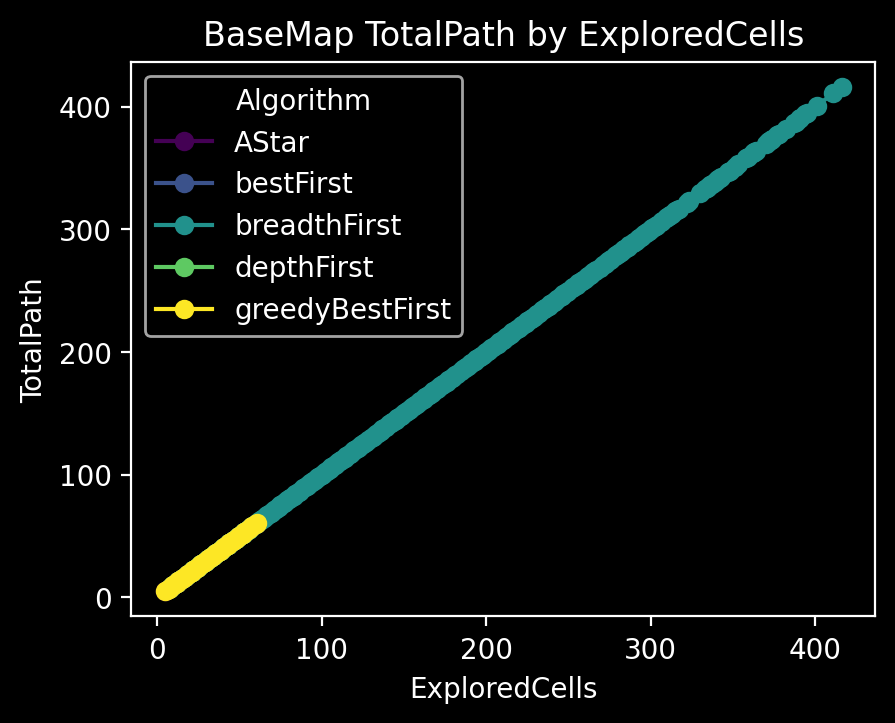

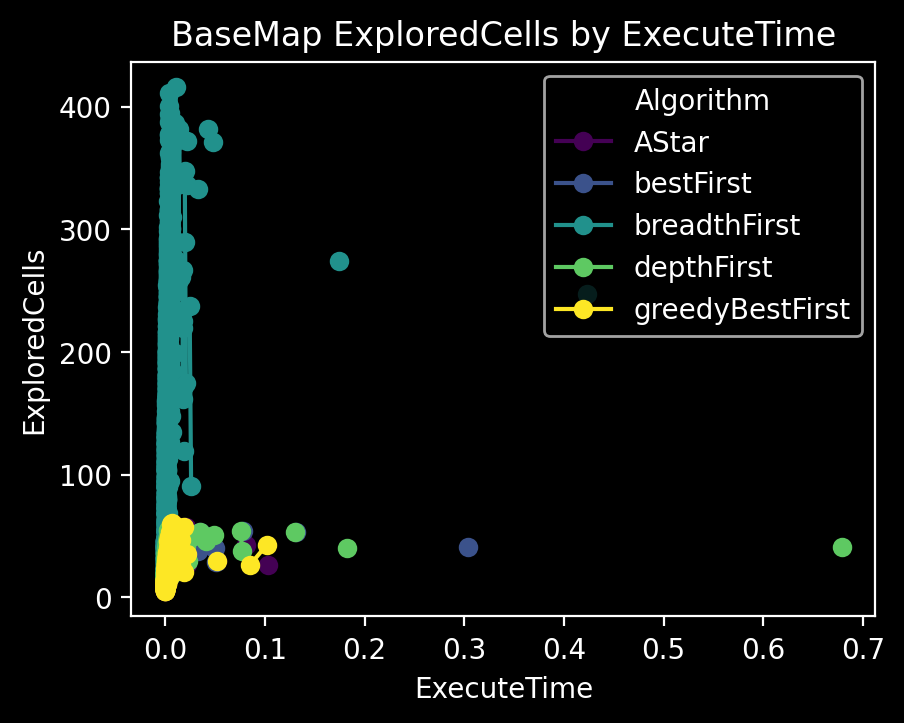

...

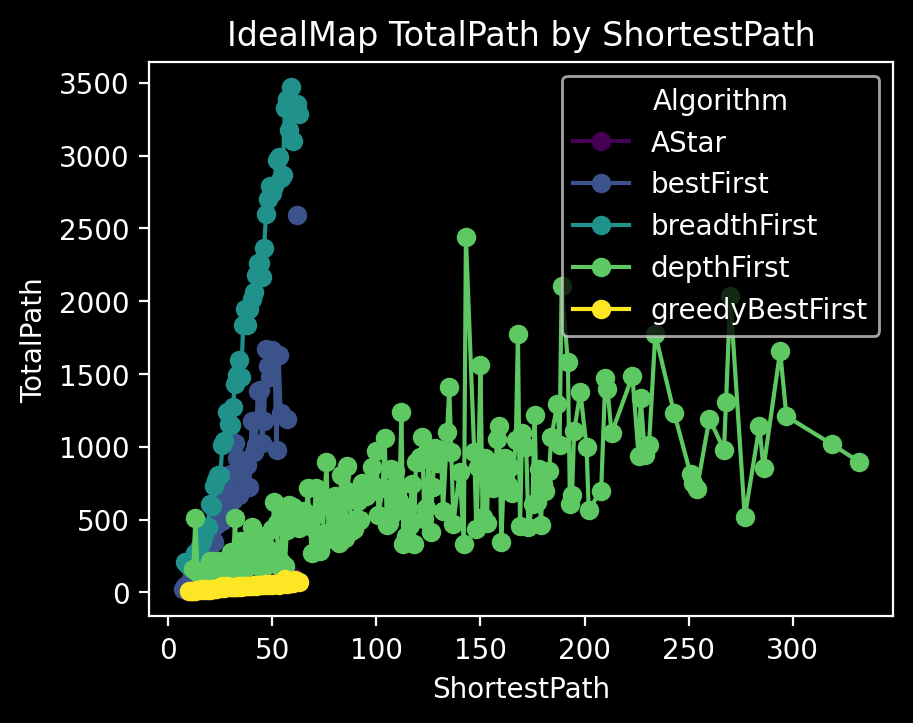

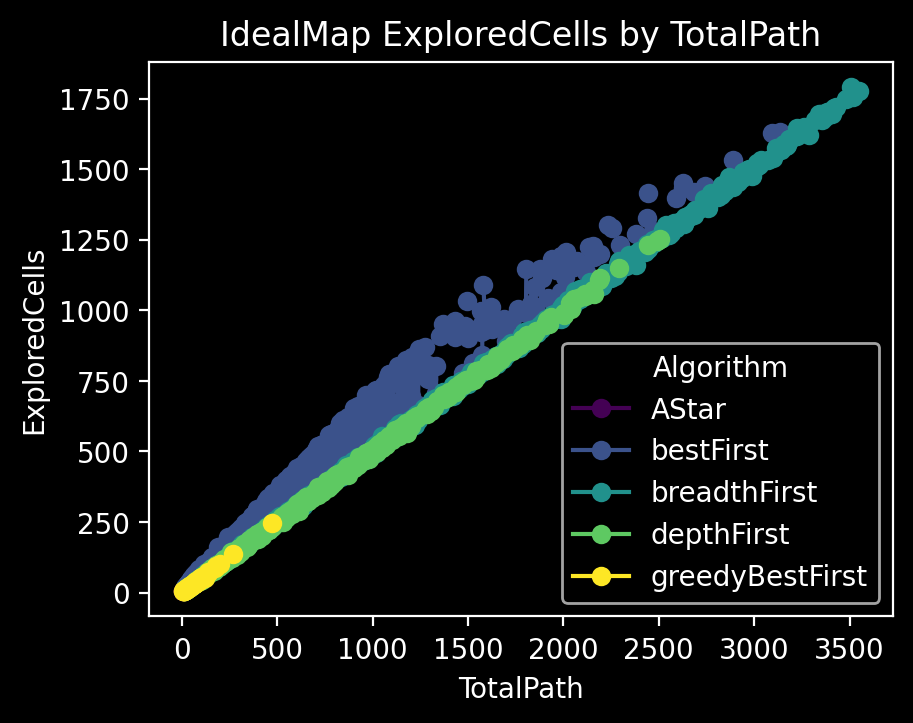

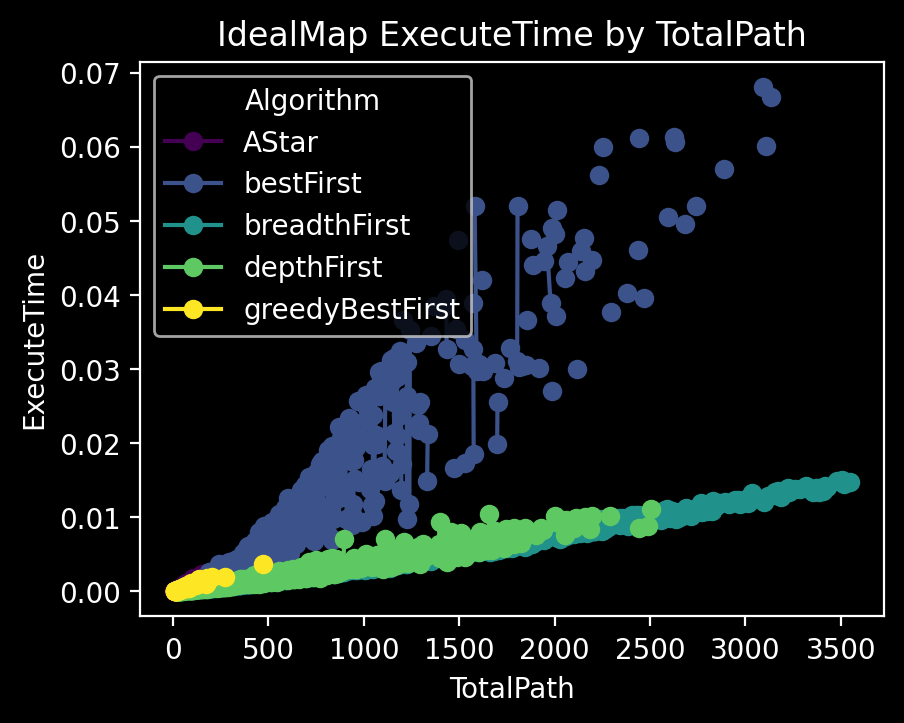

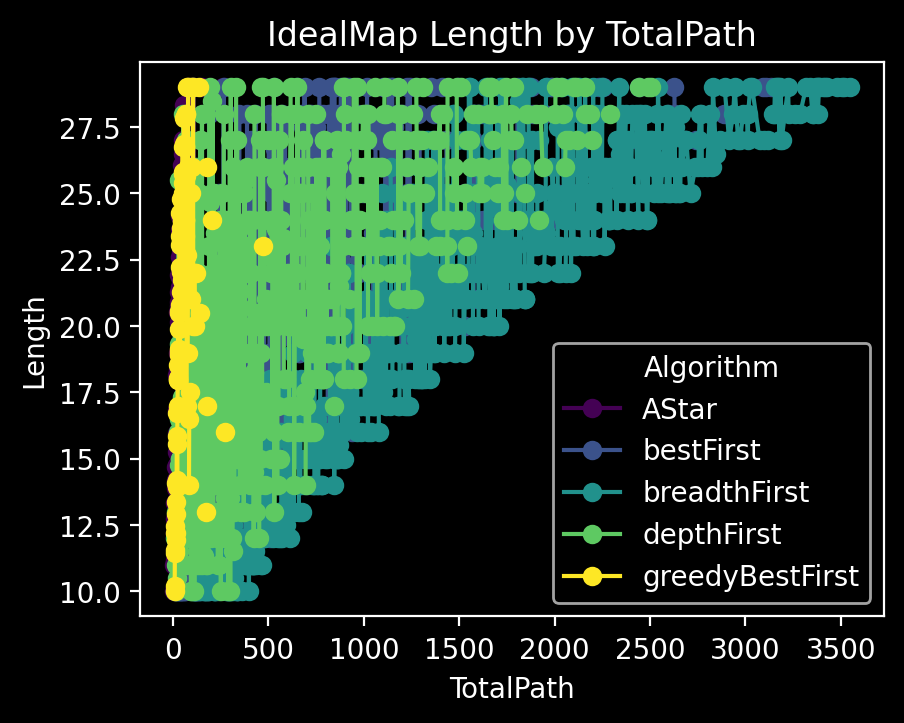

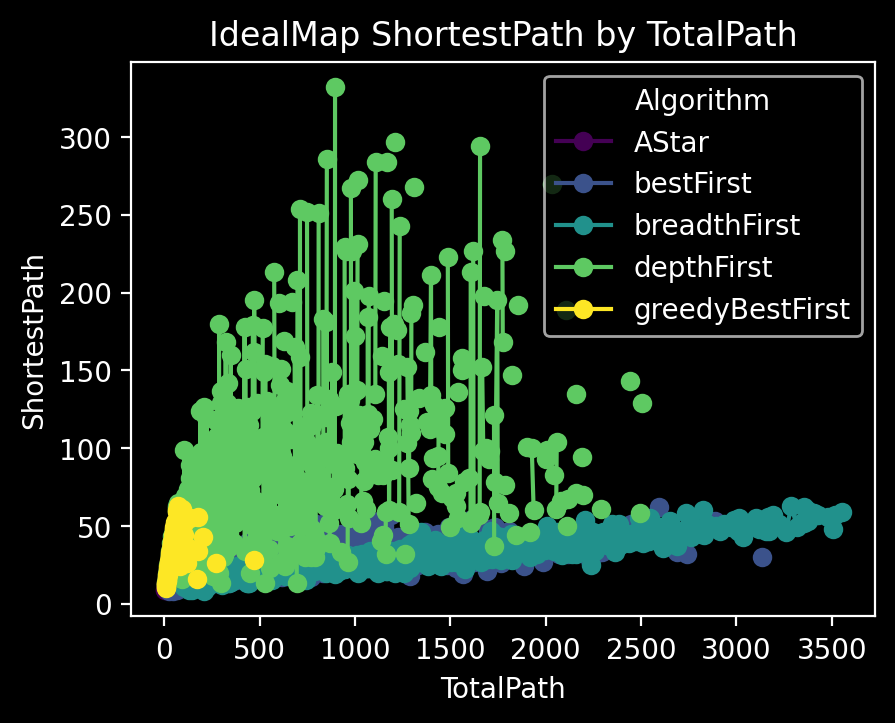

In [12]:
for mapName in mapNames:
    for index, category1 in enumerate(Categories):
        remaining = list(Categories[:index] + Categories[index + 1:]) 
        for category2 in remaining:
            plotGraph(mapName, category1, category2)